<a href="https://colab.research.google.com/github/Luciahelenasantos/Deep_Learning/blob/main/MVP_SPRINT_II_Deep_Learning270223.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import numpy as np
import pandas as pd
import os
import zipfile
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import seaborn as sns # biblioteca para criação de gráficos
import sklearn.metrics as skm
import itertools
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics._plot import confusion_matrix
from sklearn.metrics import confusion_matrix
from keras.preprocessing.image import ImageDataGenerator
from keras import models
from keras import layers
from google.colab import drive # acesso ao drive do google Colab - 'drive.mount'

In [ ]:
#!pip install gdown
#import gdown

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
#https://drive.google.com/drive/folders/1HFRsskdEKpQv_0ehFQjxgISQU5yzpNAr?usp=sharing

In [ ]:
#file_id = “GOOGLE_DRIVE_FILE_ID”
#url = f"https://drive.google.com/uc?id={file_id}"
#output = “file_name.extension”
#gdown.download(url, output)

file_id = "1HFRsskdEKpQv_0ehFQjxgISQU5yzpNAr"
url = f"https://drive.google.com/uc?id={file_id}"
output = "file_name.extension"
gdown.download(url, output)

Access denied with the following error:



 	Cannot retrieve the public link of the file. You may need to change
	the permission to 'Anyone with the link', or have had many accesses. 

You may still be able to access the file from the browser:

	 https://drive.google.com/uc?id=1HFRsskdEKpQv_0ehFQjxgISQU5yzpNAr 



In [2]:
# Função que cria a variável "class" com valores categóricos

def calcula_classe_fire(fire):
  vfire = fire

  if fire == 0:
    return "Sem fogo"
  elif fire == 1:
    return "Com fogo"



def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    Esta função imprime e plota a matriz de confusão.
    A normalização pode ser aplicada definindo `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Matriz de confusão normalizada")
    else:
        print('Matriz de confusão sem normalização')

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('Label real')
    plt.xlabel('Label predito')

# ***2. Acessando e tratando os dados que serão a entrada do modelo de deep learning***

In [ ]:
# Apontando para My Drive

drive.mount('/content/drive', force_remount=True)
os.chdir('/content/drive/My Drive/')

Mounted at /content/drive


Verificando a pasta que foi extraída do `.zip`

In [ ]:
import os

r = 'https://github.com/Luciahelenasantos/Deep_Learning/tree/main/datafire/working/train_images/train'
!git clone https://github.com/Luciahelenasantos/Deep_Learning
%cd Deep_Learning/datafire/working/train_images/train

In [25]:
print(os.listdir())

['ck0t1qg3kyft90a46nddriu6k_jpeg_jpg.rf.e8404c7111890fcfd198274575dcdae4.jpg', 'ck0tzp3rvummy07010t4dolzz_jpeg_jpg.rf.b6698d4ca1f37e722b568d201428bf6f.jpg', 'img_387_jpg.rf.9d619d41e89d5ebcefb3fda8a6aaeaeb.jpg', 'ck0kn591g92v60944tmg09bpa_jpeg_jpg.rf.79306db35c183e06d1b9eb165a85de35.jpg', 'img_354_jpg.rf.3cff3d39065fe1420ee02d7530418131.jpg', 'ck0ovtzvntedo08385kjpyx6a_jpeg_jpg.rf.8288b0e91626e729de41761cafd39016.jpg', 'img_258_jpg.rf.a998a335dd2215fb66ea25f9a62c078e.jpg', 'img_343_jpg.rf.9f8963e90b6aea2410cf526dc68a9b09.jpg', 'ck0ow39yt6j650a4633r8lu2g_jpeg_jpg.rf.30f710a451dc40f3adcc4b3f2837b691.jpg', 'ck0txsj116ojr0848emet52dc_jpeg_jpg.rf.209be0d5cc392d2f3ae6fe0cbd9f550e.jpg', 'ck0tt357asc4k0838zbkl0wrd_jpeg_jpg.rf.148f16f686f289ba7ecd0892fcf29c72.jpg', '141_jpg.rf.81625a9961330a78ac9ce1a58d13c51a.jpg', 'ck0ken8886dvt0838isatschp_jpeg_jpg.rf.e4286ce5ee2d9726fcfa18d9890eb27e.jpg', 'ck0kcpbi29y0x0721g7dlzzcs_jpeg_jpg.rf.f367ff01e2a386b2a995a6fdfe063e12.jpg', 'img_413_jpg.rf.99e2f8eea5

Verificando o número de imagens que foram extraídas

In [99]:
#path='datafire/working/train_images/train/'
path = r
print(f"Temos um total de {len(os.listdir())} imagens para o treinamento e avaliação do modelo de deep learning")

Temos um total de 788 imagens para o treinamento e avaliação do modelo de deep learning


Exemplos de algumas imagens extraídas

In [102]:
print(f"Primeiras 20 imagens: \n {os.listdir()[:20]}")

Primeiras 20 imagens: 
 ['ck0t1qg3kyft90a46nddriu6k_jpeg_jpg.rf.e8404c7111890fcfd198274575dcdae4.jpg', 'ck0tzp3rvummy07010t4dolzz_jpeg_jpg.rf.b6698d4ca1f37e722b568d201428bf6f.jpg', 'img_387_jpg.rf.9d619d41e89d5ebcefb3fda8a6aaeaeb.jpg', 'ck0kn591g92v60944tmg09bpa_jpeg_jpg.rf.79306db35c183e06d1b9eb165a85de35.jpg', 'img_354_jpg.rf.3cff3d39065fe1420ee02d7530418131.jpg', 'ck0ovtzvntedo08385kjpyx6a_jpeg_jpg.rf.8288b0e91626e729de41761cafd39016.jpg', 'img_258_jpg.rf.a998a335dd2215fb66ea25f9a62c078e.jpg', 'img_343_jpg.rf.9f8963e90b6aea2410cf526dc68a9b09.jpg', 'ck0ow39yt6j650a4633r8lu2g_jpeg_jpg.rf.30f710a451dc40f3adcc4b3f2837b691.jpg', 'ck0txsj116ojr0848emet52dc_jpeg_jpg.rf.209be0d5cc392d2f3ae6fe0cbd9f550e.jpg', 'ck0tt357asc4k0838zbkl0wrd_jpeg_jpg.rf.148f16f686f289ba7ecd0892fcf29c72.jpg', '141_jpg.rf.81625a9961330a78ac9ce1a58d13c51a.jpg', 'ck0ken8886dvt0838isatschp_jpeg_jpg.rf.e4286ce5ee2d9726fcfa18d9890eb27e.jpg', 'ck0kcpbi29y0x0721g7dlzzcs_jpeg_jpg.rf.f367ff01e2a386b2a995a6fdfe063e12.jpg', 'i

Criando um dataframe com as informações das imagens

In [37]:
import requests
import pandas as pd
import io

url = 'https://raw.githubusercontent.com/Luciahelenasantos/Deep_Learning/main/datafire/working/train_images/_annotations.csv'
response = requests.get(url)
data = response.content

df = pd.read_csv(io.StringIO(data.decode('utf-8')), delimiter=',')


In [ ]:
#df = pd.read_csv('https://github.com/Luciahelenasantos/Deep_Learning/tree/main/datafire/working/train_images/_annotations.csv', delimiter = ',')

#https://github.com/Luciahelenasantos/Deep_Learning.git

In [38]:
df

,filename,width,height,class,xmin,ymin,xmax,ymax
0,ck0tyk5ussex90863mbb4h9of_jpeg_jpg.rf.d0a27e22...,448,448,0,267,198,428,266
1,img_924_jpg.rf.d10505c94256b4b2a78d140f812dea1...,448,448,0,112,135,384,427
2,ck0ug3zlfw61d09445i888ftl_jpeg_jpg.rf.d1bd5da4...,448,448,0,70,146,288,285
3,ck0t2d3kbyou40a46a56kl6x8_jpeg_jpg.rf.d1d5fc7d...,448,448,0,270,202,326,231
4,ck0ujzue9uicd08638rcyl1ro_jpeg_jpg.rf.d215ddd1...,448,448,0,49,147,284,289
...,...,...,...,...,...,...,...,...
859,ck0tzttgusl7o0863k0kfvcid_jpeg_jpg.rf.7ffc4f55...,448,448,0,105,192,145,210
860,ck0keprw9ke1d08483vmle7ed_jpeg_jpg.rf.7a4625db...,448,448,0,1,105,105,311
861,ck0keo0re4xll086378211i65_jpeg_jpg.rf.80562d84...,448,448,0,136,194,149,215
862,ck0lxe157jywu0721jwuvnom0_jpeg_jpg.rf.7adfcd1d...,448,448,0,117,241,136,259


In [39]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 864 entries, 0 to 863
Data columns (total 8 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   filename  864 non-null    object
 1   width     864 non-null    int64 
 2   height    864 non-null    int64 
 3   class     864 non-null    int64 
 4   xmin      864 non-null    int64 
 5   ymin      864 non-null    int64 
 6   xmax      864 non-null    int64 
 7   ymax      864 non-null    int64 
dtypes: int64(7), object(1)
memory usage: 54.1+ KB


In [40]:
# Renomeando os atributos com nome abreviado para facilitar a interpretação
# nos gráficos

df.rename(columns = {'filename': 'images', 'width': 'widths', 'height': 'heights',
                     'class': 'class1'}, inplace = True);

In [41]:
# Criando a variável numérica que identifica a classificação do AQI para cada poluente

df['class'] = df['class1'].apply(calcula_classe_fire)

In [42]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 864 entries, 0 to 863
Data columns (total 9 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   images   864 non-null    object
 1   widths   864 non-null    int64 
 2   heights  864 non-null    int64 
 3   class1   864 non-null    int64 
 4   xmin     864 non-null    int64 
 5   ymin     864 non-null    int64 
 6   xmax     864 non-null    int64 
 7   ymax     864 non-null    int64 
 8   class    864 non-null    object
dtypes: int64(7), object(2)
memory usage: 60.9+ KB


In [ ]:
#images = os.listdir(path)

#labels, heights, widths, channels, filesize = [], [], [], [], []

# Loop que percorre cada uma das imagens extraídas
""" for fname in images:

    labels.append(str(fname)[:3])
    img_shape = mpimg.imread(path+fname).shape
    heights.append(img_shape[0])
    widths.append(img_shape[1])
    channels.append(img_shape[2])
    filesize.append(os.path.getsize(path+fname))
"""

# Criação do dataset
#df = pd.DataFrame({'images': images, 'class': labels, 'height': heights,
#                         'width': widths, 'channels': channels, 'filesize': filesize})

' for fname in images:\n\n    labels.append(str(fname)[:3])\n    img_shape = mpimg.imread(path+fname).shape\n    heights.append(img_shape[0])\n    widths.append(img_shape[1])\n    channels.append(img_shape[2])\n    filesize.append(os.path.getsize(path+fname))\n'

Visualização do dataset criado

In [43]:
df

,images,widths,heights,class1,xmin,ymin,xmax,ymax,class
0,ck0tyk5ussex90863mbb4h9of_jpeg_jpg.rf.d0a27e22...,448,448,0,267,198,428,266,Sem fogo
1,img_924_jpg.rf.d10505c94256b4b2a78d140f812dea1...,448,448,0,112,135,384,427,Sem fogo
2,ck0ug3zlfw61d09445i888ftl_jpeg_jpg.rf.d1bd5da4...,448,448,0,70,146,288,285,Sem fogo
3,ck0t2d3kbyou40a46a56kl6x8_jpeg_jpg.rf.d1d5fc7d...,448,448,0,270,202,326,231,Sem fogo
4,ck0ujzue9uicd08638rcyl1ro_jpeg_jpg.rf.d215ddd1...,448,448,0,49,147,284,289,Sem fogo
...,...,...,...,...,...,...,...,...,...
859,ck0tzttgusl7o0863k0kfvcid_jpeg_jpg.rf.7ffc4f55...,448,448,0,105,192,145,210,Sem fogo
860,ck0keprw9ke1d08483vmle7ed_jpeg_jpg.rf.7a4625db...,448,448,0,1,105,105,311,Sem fogo
861,ck0keo0re4xll086378211i65_jpeg_jpg.rf.80562d84...,448,448,0,136,194,149,215,Sem fogo
862,ck0lxe157jywu0721jwuvnom0_jpeg_jpg.rf.7adfcd1d...,448,448,0,117,241,136,259,Sem fogo


Visualização do número de imagens por classe

In [44]:
df['class'].unique()

array(['Sem fogo', 'Com fogo'], dtype=object)

In [45]:
sns.set_style('darkgrid')
sns.set_theme(style="darkgrid", font_scale=0.9)

## 2. Acessando e tratando os dados que serão a entrada do modelo de deep learning

Visualização do número de imagens por classe

Sem fogo    593
Com fogo    271
Name: class, dtype: int64


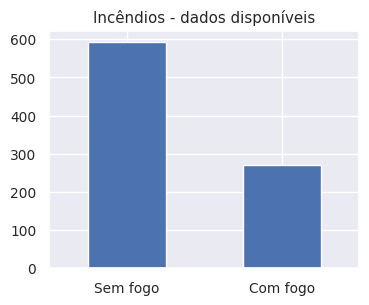

In [46]:
print((df['class']).value_counts())

plt.figure(figsize=(4, 3))
fire_count = df['class'].value_counts().plot.bar(title='Incêndios - dados disponíveis')
plt.subplots_adjust(top=0.9)
plt.xticks(rotation=360)
plt.show()

Visualizando algumas imagens do conjunto de dados

In [47]:
images = df['images']

In [63]:
import requests
from PIL import Image
import matplotlib.image as mpimg

UnidentifiedImageError: ignored

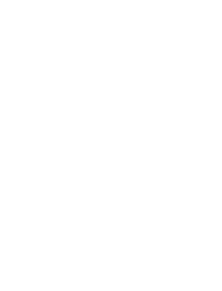

In [109]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np

fig = plt.gcf()
fig.set_size_inches(3*4, 3*4)

# Visualizando apenas 12 imagens
for i in range(12):

    sample = np.random.choice(images)
    img_path = path + sample
    sp = plt.subplot(3, 4, i + 1)
    sp.axis('Off')

    response = requests.get(img_path)
    img = Image.open(io.BytesIO(response.content))

    #img = mpimg.imread(img_path)
    plt.imshow(img)

    if sample[:3] == 'img':
      plt.title('Com fogo')
    elif sample[:3] != 'img':
      plt.title('Sem fogo')

plt.show()


In [108]:
response

<Response [404]>

In [75]:
img_path

'https://github.com/Luciahelenasantos/Deep_Learning/tree/main/datafire/working/train_images/trainck0lx8c34u38a08480v1hz7dz_jpeg_jpg.rf.1c0b15c0b3ff70af96b6d140391a7247.jpg'

In [53]:
path+sample

'https://github.com/Luciahelenasantos/Deep_Learning/tree/main/datafire/working/train_images/train141_jpg.rf.81625a9961330a78ac9ce1a58d13c51a.jpg'

In [ ]:
sample[9:1]

''

Divisão dos dados em treino e teste: 30% das imagens para teste e 70% para treinamento do modelo de deep learning. Importante lembrar que os conjuntos devem ser disjuntos, ou seja, não devem poussir nenhum elemento em comum.

In [ ]:
train, test =train_test_split(df[['images' , 'class']] ,test_size=0.3 ,random_state=42 , shuffle=True)

Visualizando a divisão dos dados

In [ ]:
print("##### Train: #####")
print(train)
print("##### Test: #####")
print(test)

##### Train: #####
                                                images     class
850  img_438_jpg.rf.7c63d605fa4794d8fa2ce6c5e7756f4...  Com fogo
193  img_106_jpg.rf.0e5aec583bf1ee4e56a8e0ef146eaa5...  Sem fogo
280  ck0qdhfh1uks20848pclbrty6_jpeg_jpg.rf.258ae4a7...  Sem fogo
468  ck0u13xaxuv4k07010miwxisb_jpeg_jpg.rf.ad39e0ac...  Sem fogo
486  ck0t1zwemkseu08636i7fpksi_jpeg_jpg.rf.af596fa4...  Sem fogo
..                                                 ...       ...
106  ck0k99e6p79go0944lmxivkmv_jpeg_jpg.rf.f048b8d8...  Sem fogo
270  img_646_jpg.rf.1f666f053ca5b1c7c6bbb7fe08df29c...  Com fogo
860  ck0keprw9ke1d08483vmle7ed_jpeg_jpg.rf.7a4625db...  Sem fogo
435  ck0qbnoibg4ip0838na1tnqe8_jpeg_jpg.rf.a28231b9...  Sem fogo
102  ck0l939lbnftj0a46atyx4hh4_jpeg_jpg.rf.ef9cc98a...  Sem fogo

[604 rows x 2 columns]
##### Test: #####
                                                images     class
198  img_449_jpg.rf.0fb72a6884a61dfdaa7622ad422f601...  Com fogo
720  img_388_jpg.rf.532a1d8de

#### Preparação dos dados

`ImageDataGenerator` é uma classe utilitária fornecida pelo TensorFlow para aumentar e pré-processar dados de imagens. É comumente usada em tarefas de deep learning, especialmente para classificação de imagens, para gerar imagens aumentadas (data augmentation) sob demanda durante o treinamento do modelo.

Utilizamos ainda o `ImageDataGenerator` para separar um conjunto de validação com 20% das amostras do conjunto de treino. É importante que o conjunto de validação não contenha as imagens de teste, tendo em vista que elas não deveriam ser conhecidas no momento do treinamento.

Veja que neste caso é usado o método `flow_from_dataframe()` para gerar imagens aumentadas a partir de um dataframe que aponta para as imagens originais. O método recebe parâmetros como o dataframe, o diretório com as imagens, o tamanho do lote (batch size) e o modo de classe (neste caso, binário porque são apenas duas classes), entre outros.

Importante ressaltar que o pré-processamento do teste não evolve o aumento de dados.

In [ ]:
train_datagen=ImageDataGenerator(validation_split=0.2, #include validation split
                                 rescale = 1.0/255,
                                    #rotation_range=40,
                                    shear_range=0.2,
                                    zoom_range=0.2,
                                    horizontal_flip=True,
                                    fill_mode='nearest')

test_datagen=ImageDataGenerator(rescale=1./255)


train_generator=train_datagen.flow_from_dataframe(
    train ,path,
    target_size=(150,150),
    batch_size=100, #50
    class_mode='binary',
    x_col='images',
    y_col='class',
    subset='training' #training set
    )

val_generator=train_datagen.flow_from_dataframe(
    train ,path,
    target_size=(150,150),
    batch_size=100, #50
    class_mode='binary',
    x_col='images',
    y_col='class',
    subset='validation' #validation set
    )

test_generator=test_datagen.flow_from_dataframe(
    test ,path,
    target_size=(150,150),
    batch_size=100, #50
    class_mode='binary',
    x_col='images',
    y_col='class',)

Found 484 validated image filenames belonging to 2 classes.
Found 120 validated image filenames belonging to 2 classes.
Found 260 validated image filenames belonging to 2 classes.


Visualizando um exemplo do tratamento das imagens

Found 1 validated image filenames belonging to 1 classes.


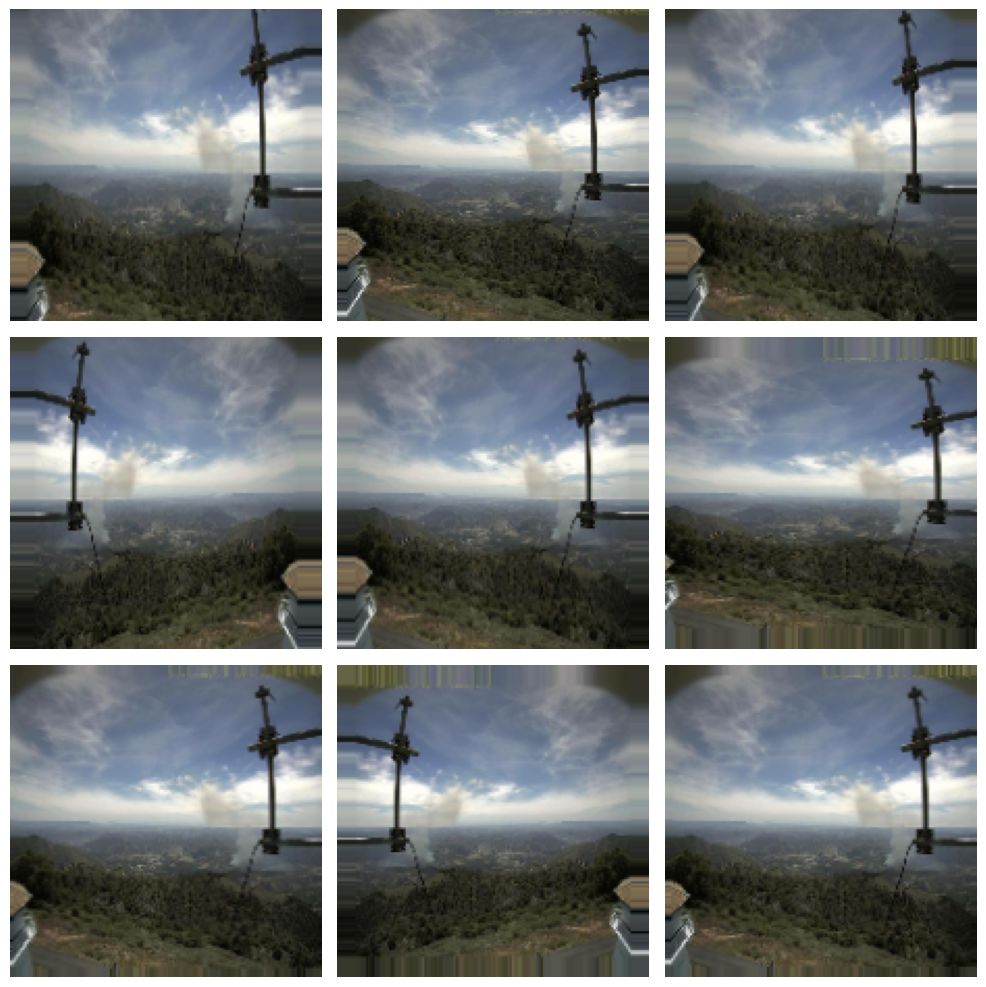

In [ ]:
# Pegando um registro do dataframe
sample = df.sample(n=1)

# Neste caso o tipo de classe é categorico, pois temos um exemplo com apenas uma classe
sample_generator = train_datagen.flow_from_dataframe(
    sample,
    path,
    x_col='images',
    y_col='class',
    target_size=(150,150),
    class_mode='categorical'
)

plt.figure(figsize=(10, 10))
for i in range(9):
    plt.subplot(3, 3, i+1)
    for x_batch, y_batch in sample_generator:
        image = x_batch[0]
        plt.imshow(image)
        plt.axis('Off')
        break
plt.tight_layout()
plt.show()

# ***3. Configuração de um modelo de deep learning usando uma rede neural convolucional (CNN) simples com a biblioteca Keras***

#### Definição da arquitetura do modelo

Aqui é especificada uma `camada convolucional 2D` que possui 32 filtros, um tamanho de filtro de 3x3 que usa a função de ativação `ReLU`. O parâmetro `input_shape` define a forma das imagens de entrada para a rede. Na sequência são adicionadas camadas `max-pooling` com a mesma função de ativação.

In [ ]:
model=models.Sequential()
model.add(layers.Conv2D(32 ,(3,3) , activation='relu' , input_shape=(150,150,3 ) ) )
model.add(layers.MaxPooling2D( (2,2)))

model.add(layers.Conv2D(64 , (3,3) , activation='relu'))
model.add(layers.MaxPooling2D( (2,2)))

model.add(layers.Conv2D(128 , (3,3) , activation='relu'))
model.add(layers.MaxPooling2D( (2,2)))

model.add(layers.Conv2D(128 , (3,3) , activation='relu'))
model.add(layers.MaxPooling2D( (2,2)))

In [ ]:
model.add(layers.Flatten() )
model.add(layers.Dropout(0.25))
model.add(layers.Dense( 512 ,activation='relu' ))
model.add(layers.Dropout(0.25))
model.add(layers.Dense( 1 , activation='sigmoid' ) )

O método `summary()` é usado para exibir um resumo da arquitetura do modelo de rede neural. Ele fornece uma representação compacta das camadas do modelo e seus parâmetros, incluindo o número de parâmetros treináveis e a forma de saída de cada camada.

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 148, 148, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 74, 74, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 36, 36, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 34, 34, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 17, 17, 128)      0

# ***4. Treinamento do modelo de deep learning***

#### Compilação do modelo Keras com as configurações do treinamento

`optimizer='adam'`: especifica o otimizador a ser usado durante o treinamento.

`loss='binary_crossentropy'`: especifica a função de perda a ser usada durante o treinamento. Para problemas de classificação binária, onde a variável alvo tem apenas duas categorias, a perda binária de entropia cruzada é freqüentemente empregada.

`metrics=['accuracy']`: especifica as métricas de avaliação a serem usadas durante o treinamento e o teste.

In [ ]:
model.compile(optimizer='adam', loss='binary_crossentropy' , metrics=['accuracy'])

O método `fit_generator()` inicia o processo de treinamento do modelo usando o gerador de dados para o treinamento `train_generator` e o gerador de dados de validação `val_generator`.

In [ ]:
#history=model.fit_generator(train_generator,
#                  steps_per_epoch=50,#50
#                  epochs=5, #5
#                  validation_data=val_generator,
#                 validation_steps=50) #50

In [ ]:
history=model.fit_generator(train_generator,
                  epochs=20,
                  validation_data=val_generator);

<ipython-input-33-5eeac37ef9af>:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history=model.fit_generator(train_generator,


Epoch 1/20
5/5 [==============================] - 39s 7s/step - loss: 0.7344 - accuracy: 0.6674 - val_loss: 0.6581 - val_accuracy: 0.7417
Epoch 2/20
5/5 [==============================] - 38s 8s/step - loss: 0.5997 - accuracy: 0.7169 - val_loss: 0.4544 - val_accuracy: 0.7667
Epoch 3/20
5/5 [==============================] - 38s 7s/step - loss: 0.4721 - accuracy: 0.7665 - val_loss: 0.4751 - val_accuracy: 0.8583
Epoch 4/20
5/5 [==============================] - 42s 8s/step - loss: 0.3406 - accuracy: 0.8554 - val_loss: 0.3712 - val_accuracy: 0.8833
Epoch 5/20
5/5 [==============================] - 35s 7s/step - loss: 0.2814 - accuracy: 0.8822 - val_loss: 0.2716 - val_accuracy: 0.8500
Epoch 6/20
5/5 [==============================] - 37s 8s/step - loss: 0.2158 - accuracy: 0.9132 - val_loss: 0.2871 - val_accuracy: 0.8583
Epoch 7/20
5/5 [==============================] - 36s 7s/step - loss: 0.1928 - accuracy: 0.9174 - val_loss: 0.2976 - val_accuracy: 0.8583
Epoch 8/20
5/5 [==================

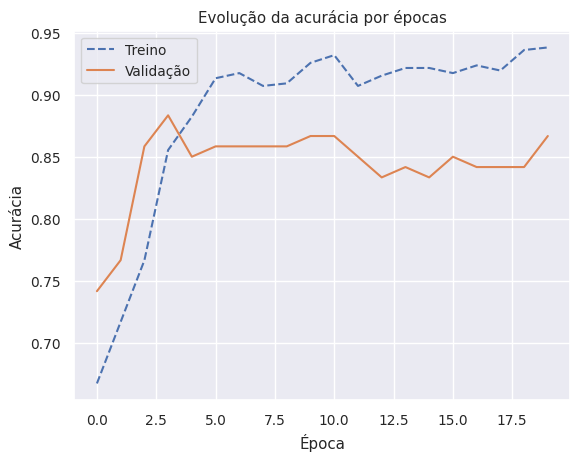

In [ ]:
# livro jornada python pag 493
plt.xlabel('Época')
plt.ylabel('Acurácia')
plt.plot(history.history['accuracy'], '--')
plt.plot(history.history['val_accuracy'])
plt.title("Evolução da acurácia por épocas")
plt.legend(['Treino', 'Validação'])
plt.show();

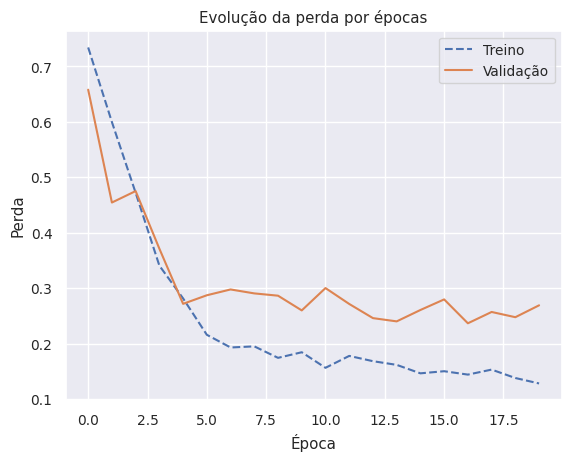

In [ ]:
# livro jornada python pag 493
plt.xlabel('Época')
plt.ylabel('Perda')
plt.plot(history.history['loss'], '--')
plt.plot(history.history['val_loss'])
plt.title("Evolução da perda por épocas")
plt.legend(['Treino', 'Validação'])
plt.show();

# ***5. Execução do modelo treinado em um subconjunto das imagems de teste***
Idealmente se deseja realizar a inferência sobre todo o conjunto de teste, porém para efeitos de agilidade, executamos apenas em um subconjunto de imagens.

4/4 [==============================] - 3s 754ms/step


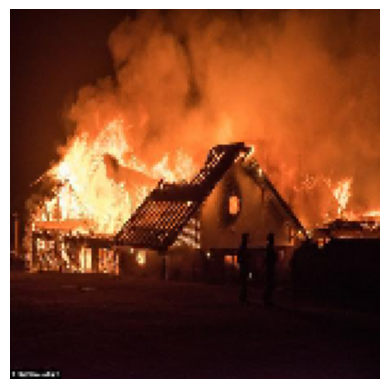

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.8004454


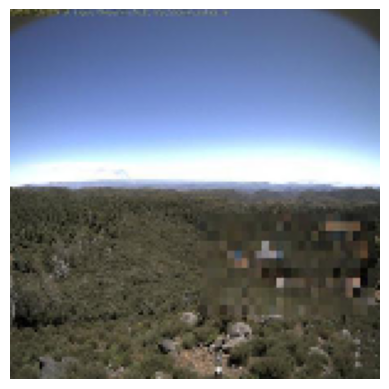

Label:  Sem fogo
Previsão:  Com fogo
Probabilidade:  0.99999285


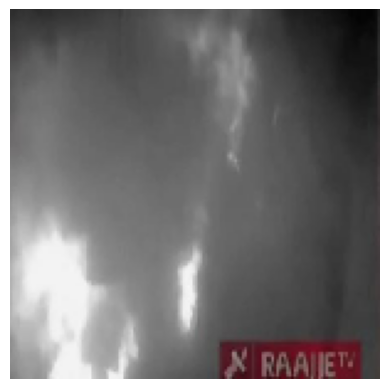

Label:  Com fogo
Previsão:  Sem fogo
Probabilidade:  0.038897444


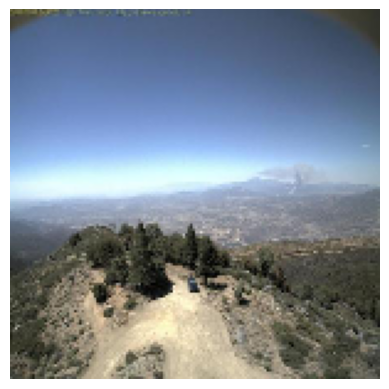

Label:  Sem fogo
Previsão:  Com fogo
Probabilidade:  0.9999762


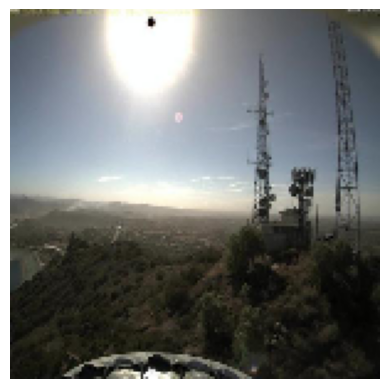

Label:  Sem fogo
Previsão:  Com fogo
Probabilidade:  0.99991506


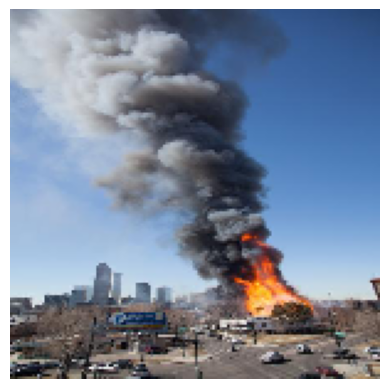

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.06762285


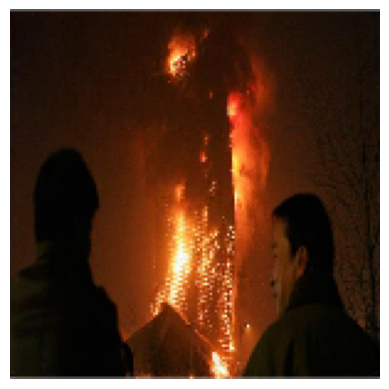

Label:  Com fogo
Previsão:  Sem fogo
Probabilidade:  0.094741926


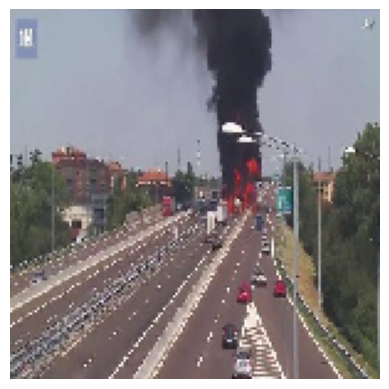

Label:  Sem fogo
Previsão:  Com fogo
Probabilidade:  0.629836


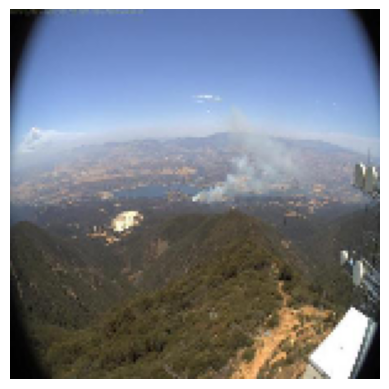

Label:  Sem fogo
Previsão:  Com fogo
Probabilidade:  0.9991821


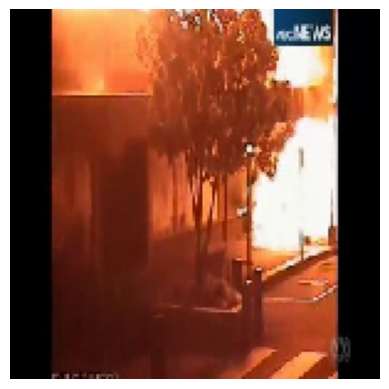

Label:  Com fogo
Previsão:  Sem fogo
Probabilidade:  0.00021263742


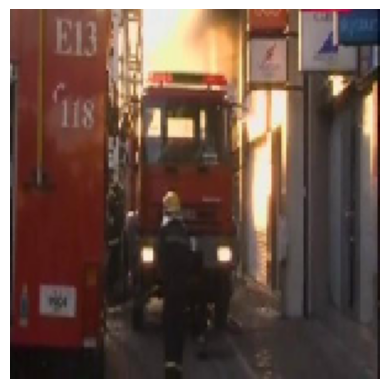

Label:  Com fogo
Previsão:  Sem fogo
Probabilidade:  0.10273761


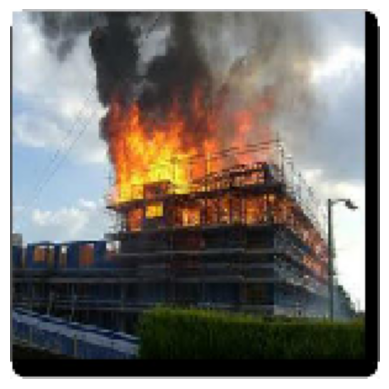

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.66382456


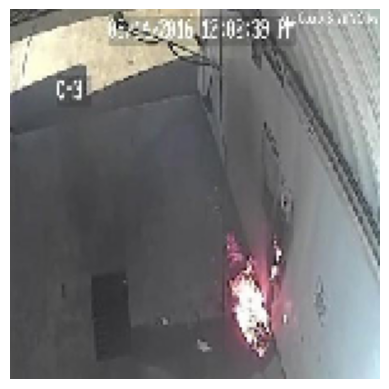

Label:  Com fogo
Previsão:  Sem fogo
Probabilidade:  0.0006956553


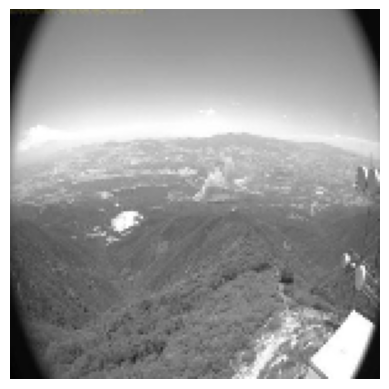

Label:  Sem fogo
Previsão:  Com fogo
Probabilidade:  0.9963224


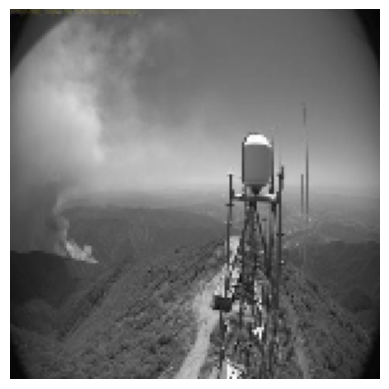

Label:  Sem fogo
Previsão:  Com fogo
Probabilidade:  0.9974144


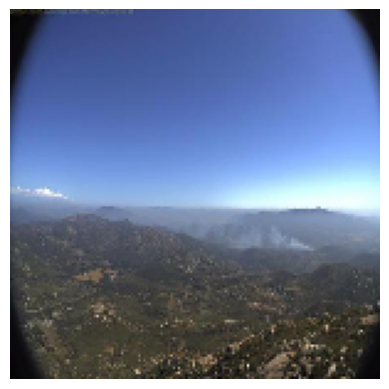

Label:  Sem fogo
Previsão:  Com fogo
Probabilidade:  0.99988824


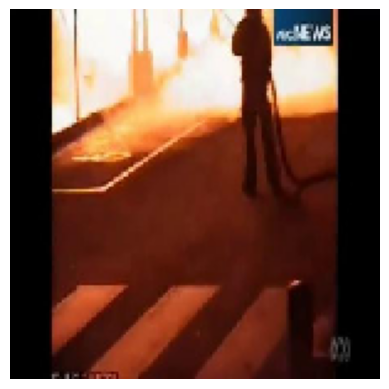

Label:  Com fogo
Previsão:  Sem fogo
Probabilidade:  2.6114201e-05


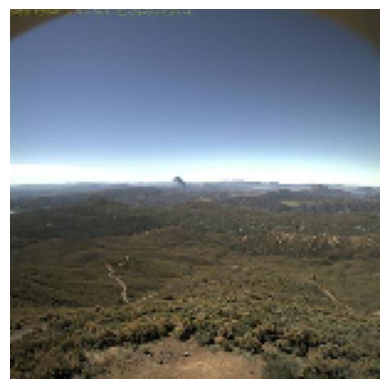

Label:  Sem fogo
Previsão:  Com fogo
Probabilidade:  0.99999547


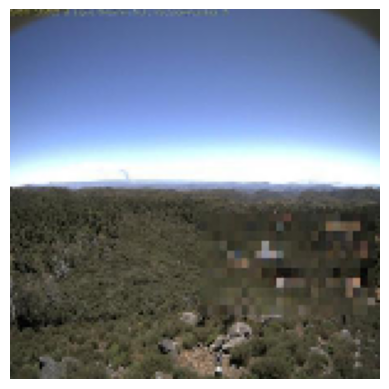

Label:  Sem fogo
Previsão:  Com fogo
Probabilidade:  0.99999326


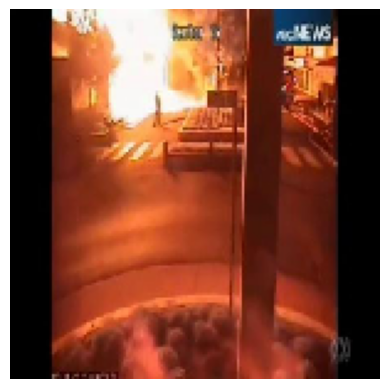

Label:  Com fogo
Previsão:  Sem fogo
Probabilidade:  0.0001241755


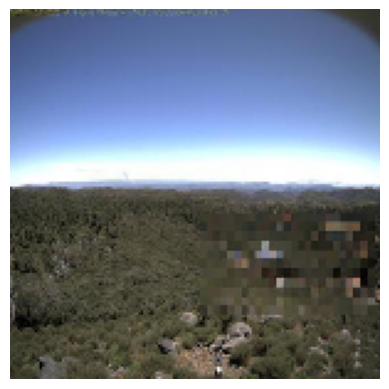

Label:  Sem fogo
Previsão:  Com fogo
Probabilidade:  0.99999315


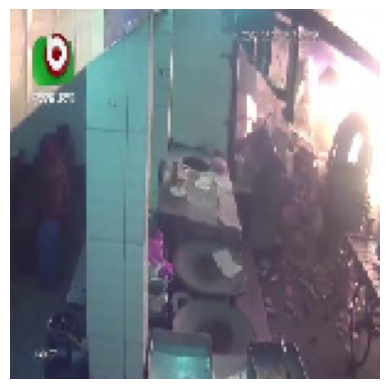

Label:  Com fogo
Previsão:  Sem fogo
Probabilidade:  0.0020381024


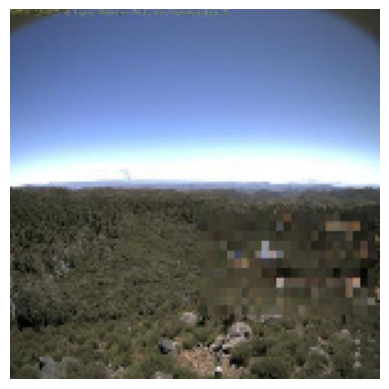

Label:  Sem fogo
Previsão:  Com fogo
Probabilidade:  0.9999931


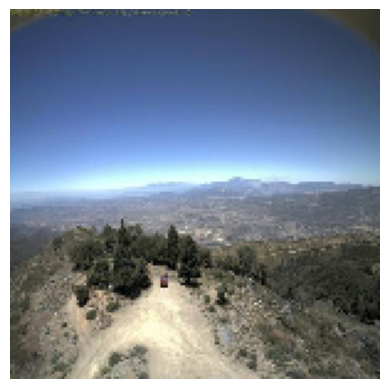

Label:  Sem fogo
Previsão:  Com fogo
Probabilidade:  0.9999775


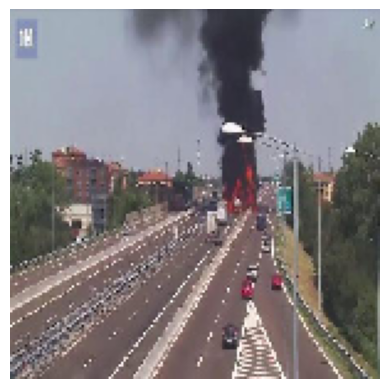

Label:  Sem fogo
Previsão:  Com fogo
Probabilidade:  0.6981328


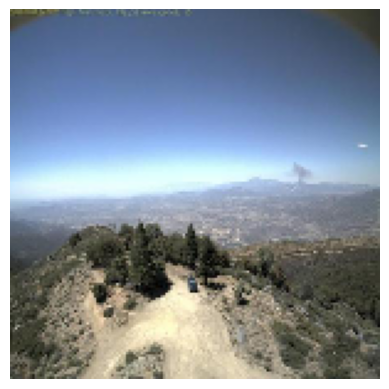

Label:  Sem fogo
Previsão:  Com fogo
Probabilidade:  0.9999776


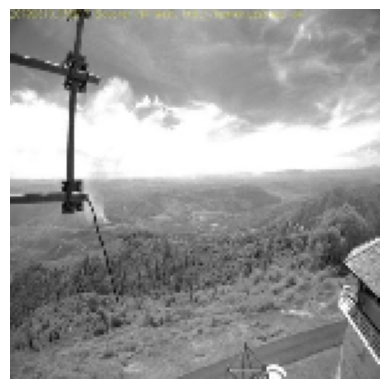

Label:  Sem fogo
Previsão:  Com fogo
Probabilidade:  0.999314


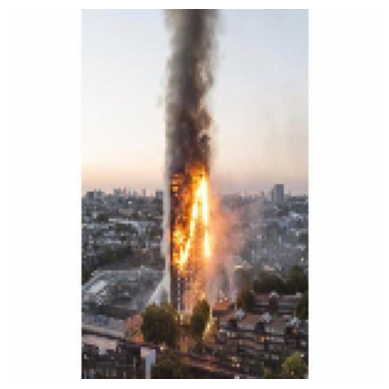

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.31218702


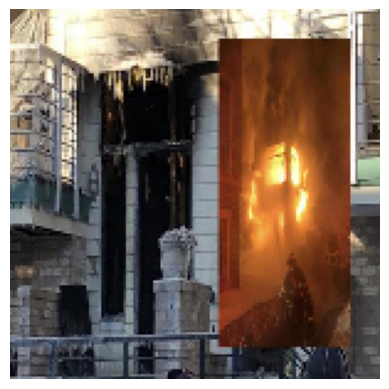

Label:  Com fogo
Previsão:  Sem fogo
Probabilidade:  0.005884666


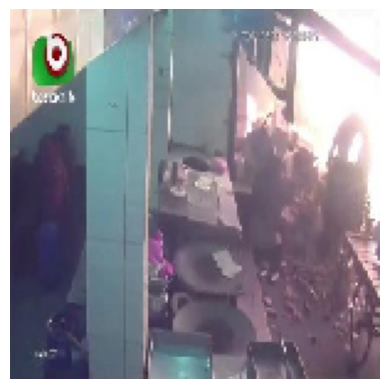

Label:  Com fogo
Previsão:  Sem fogo
Probabilidade:  0.0019159904


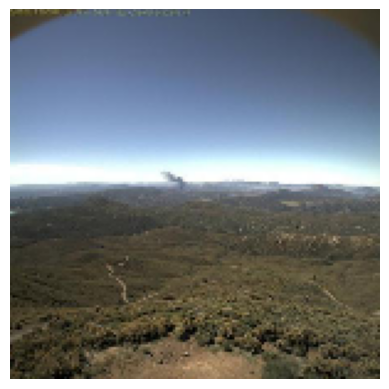

Label:  Sem fogo
Previsão:  Com fogo
Probabilidade:  0.9999957


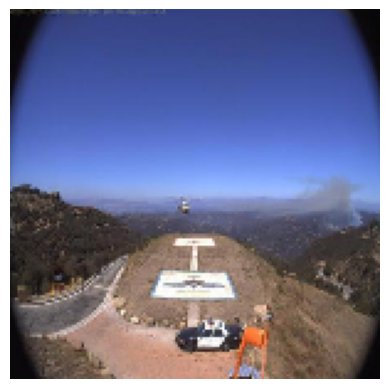

Label:  Sem fogo
Previsão:  Com fogo
Probabilidade:  0.999775


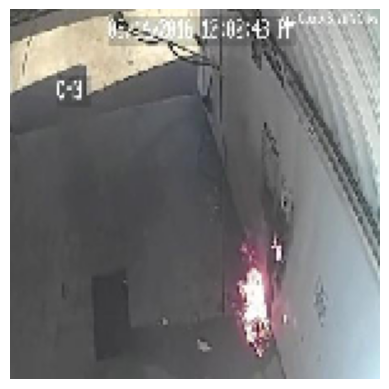

Label:  Com fogo
Previsão:  Sem fogo
Probabilidade:  0.00049989537


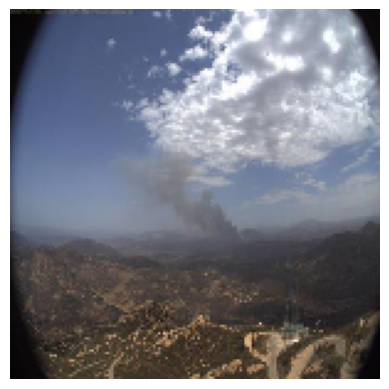

Label:  Sem fogo
Previsão:  Com fogo
Probabilidade:  0.99501765


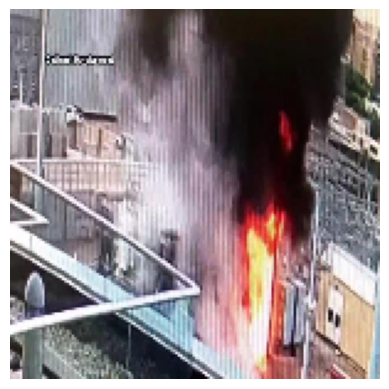

Label:  Com fogo
Previsão:  Sem fogo
Probabilidade:  0.08716464


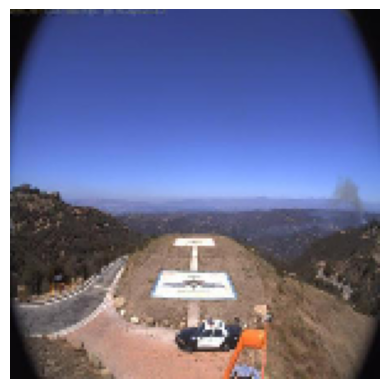

Label:  Sem fogo
Previsão:  Com fogo
Probabilidade:  0.9997986


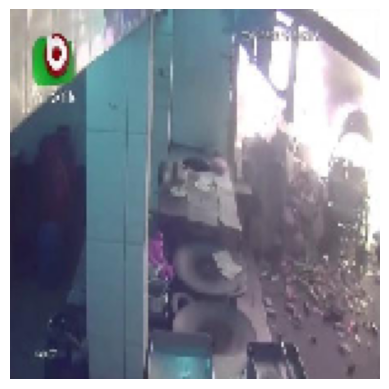

Label:  Com fogo
Previsão:  Sem fogo
Probabilidade:  0.002145935


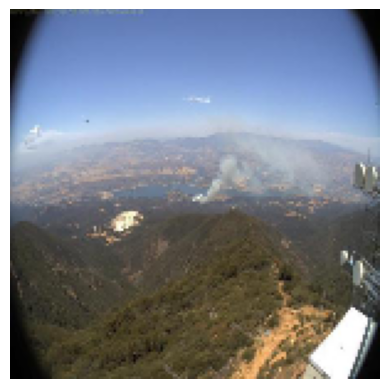

Label:  Sem fogo
Previsão:  Com fogo
Probabilidade:  0.9991513


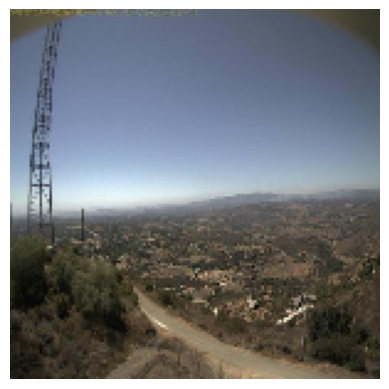

Label:  Sem fogo
Previsão:  Com fogo
Probabilidade:  0.99993646


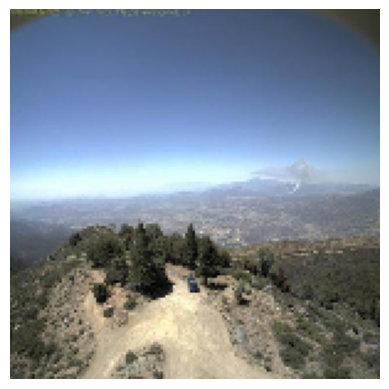

Label:  Sem fogo
Previsão:  Com fogo
Probabilidade:  0.999976


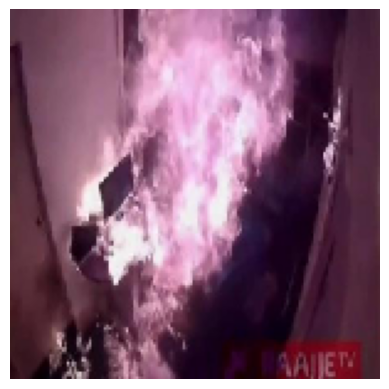

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.7519103


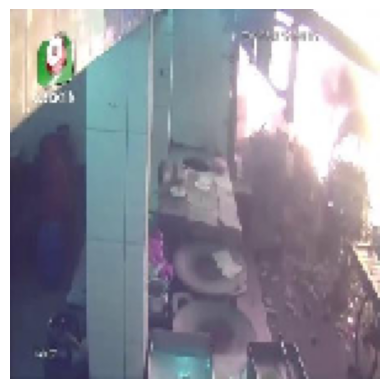

Label:  Com fogo
Previsão:  Sem fogo
Probabilidade:  0.01246999


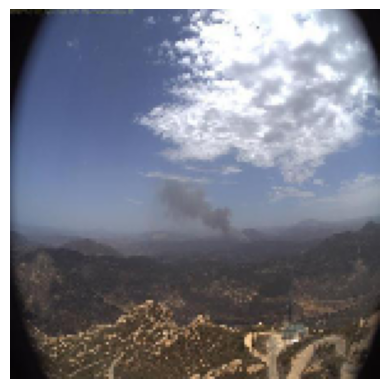

Label:  Sem fogo
Previsão:  Com fogo
Probabilidade:  0.997048


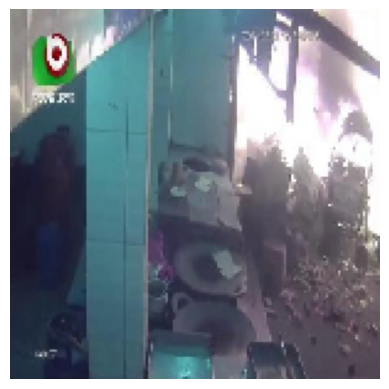

Label:  Com fogo
Previsão:  Sem fogo
Probabilidade:  0.0040704394


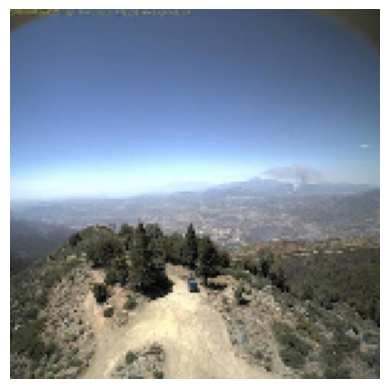

Label:  Sem fogo
Previsão:  Com fogo
Probabilidade:  0.9999782


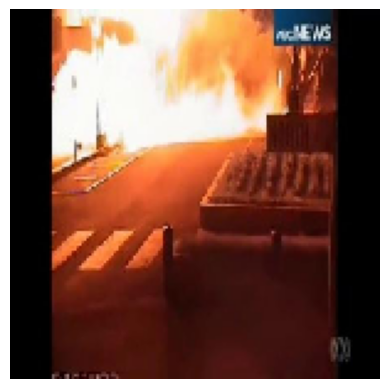

Label:  Com fogo
Previsão:  Sem fogo
Probabilidade:  0.00012151374


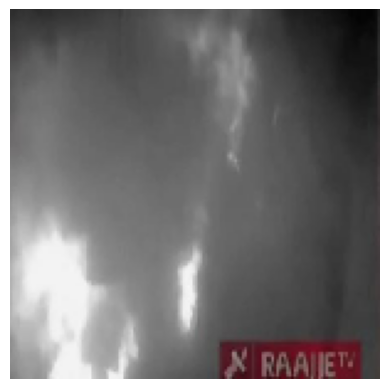

Label:  Com fogo
Previsão:  Sem fogo
Probabilidade:  0.038897444


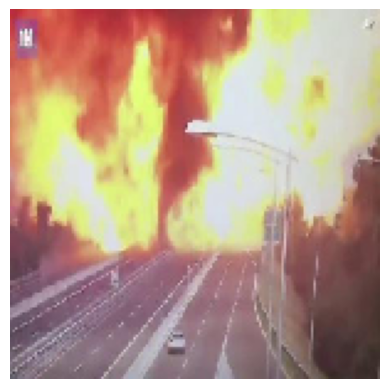

Label:  Com fogo
Previsão:  Sem fogo
Probabilidade:  0.44243956


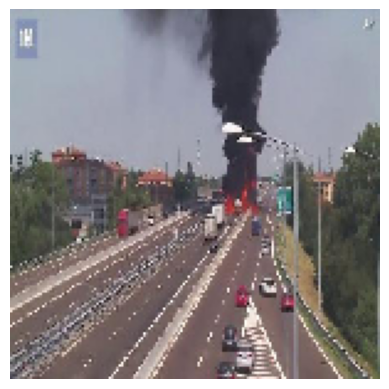

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.64340305


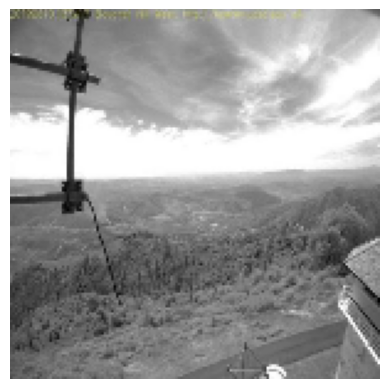

Label:  Sem fogo
Previsão:  Com fogo
Probabilidade:  0.99922764


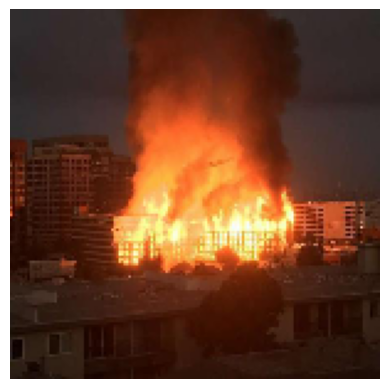

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.5479909


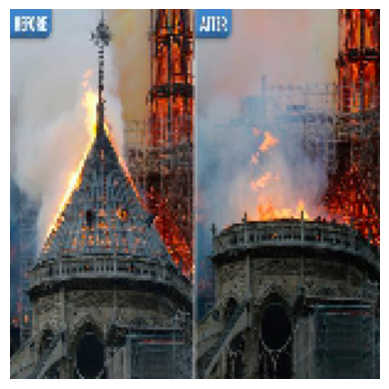

Label:  Com fogo
Previsão:  Sem fogo
Probabilidade:  0.49851385


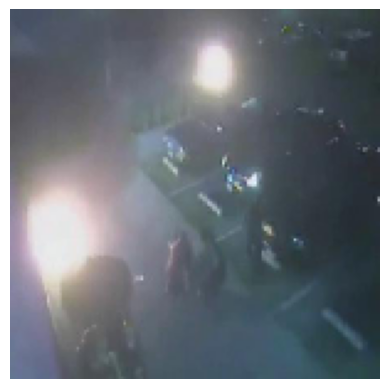

Label:  Com fogo
Previsão:  Sem fogo
Probabilidade:  0.14356324


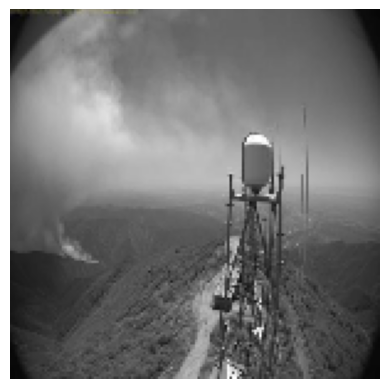

Label:  Sem fogo
Previsão:  Com fogo
Probabilidade:  0.99695915


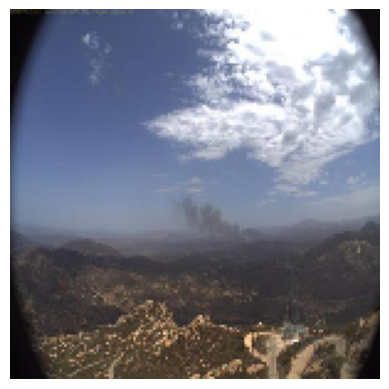

Label:  Sem fogo
Previsão:  Com fogo
Probabilidade:  0.9975853


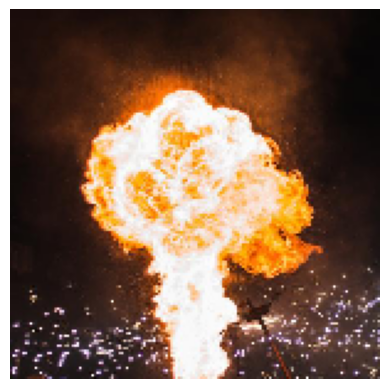

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.8036839


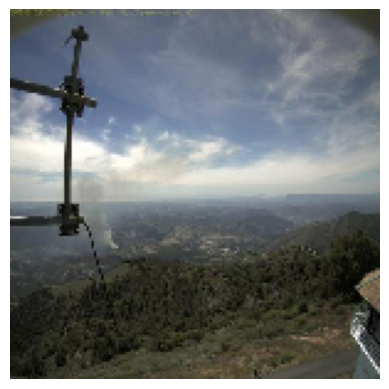

Label:  Sem fogo
Previsão:  Com fogo
Probabilidade:  0.9998062


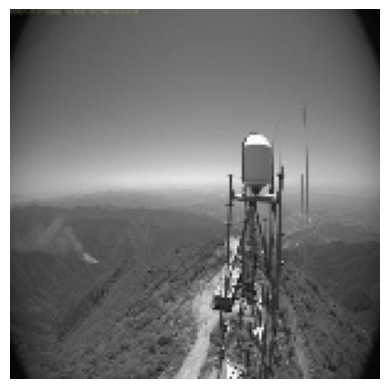

Label:  Sem fogo
Previsão:  Com fogo
Probabilidade:  0.9990412


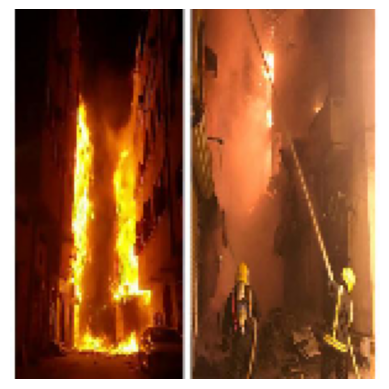

Label:  Com fogo
Previsão:  Sem fogo
Probabilidade:  0.020863028


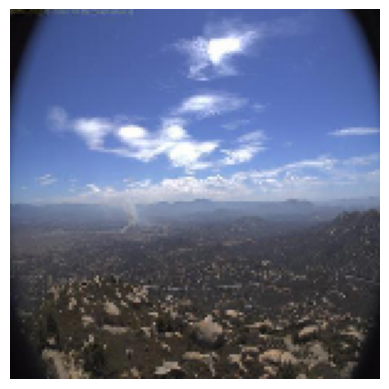

Label:  Sem fogo
Previsão:  Com fogo
Probabilidade:  0.99995387


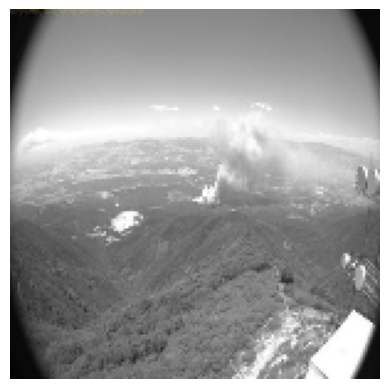

Label:  Sem fogo
Previsão:  Com fogo
Probabilidade:  0.99735886


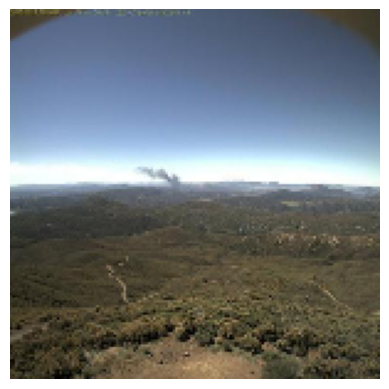

Label:  Sem fogo
Previsão:  Com fogo
Probabilidade:  0.99999565


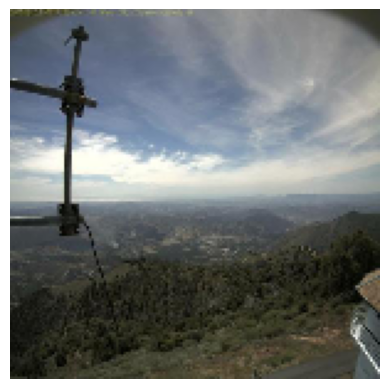

Label:  Sem fogo
Previsão:  Com fogo
Probabilidade:  0.9999247


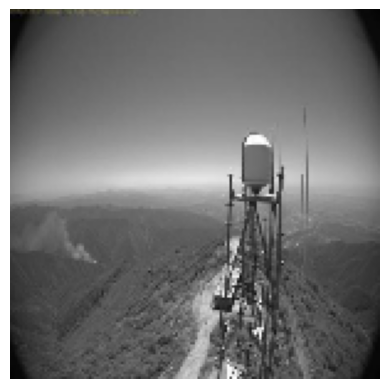

Label:  Sem fogo
Previsão:  Com fogo
Probabilidade:  0.9990348


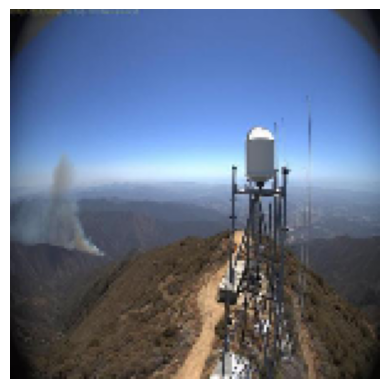

Label:  Sem fogo
Previsão:  Com fogo
Probabilidade:  0.99993134


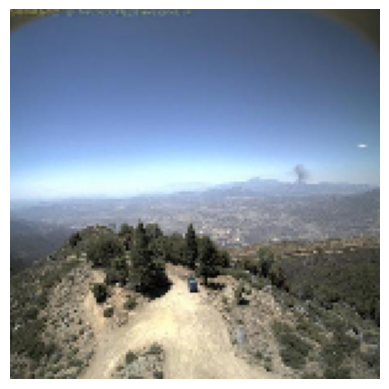

Label:  Sem fogo
Previsão:  Com fogo
Probabilidade:  0.999978


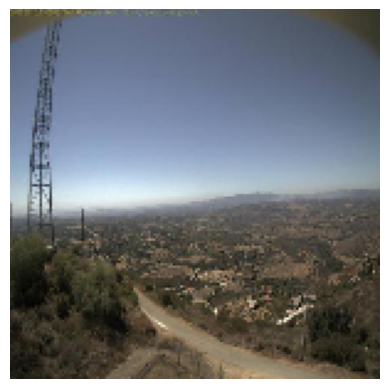

Label:  Sem fogo
Previsão:  Com fogo
Probabilidade:  0.9999364


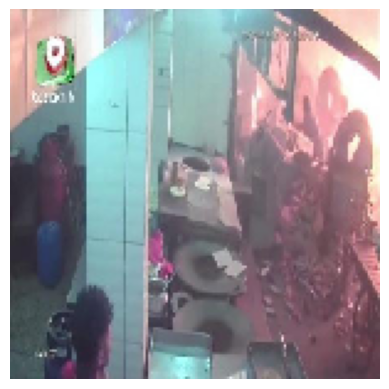

Label:  Com fogo
Previsão:  Sem fogo
Probabilidade:  0.019488476


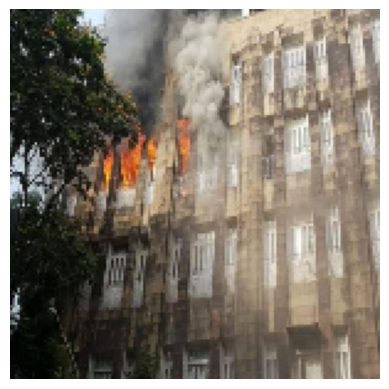

Label:  Com fogo
Previsão:  Sem fogo
Probabilidade:  0.031301938


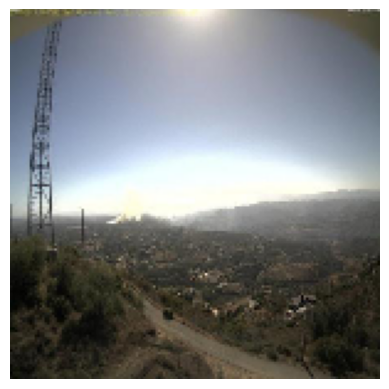

Label:  Sem fogo
Previsão:  Com fogo
Probabilidade:  0.9999953


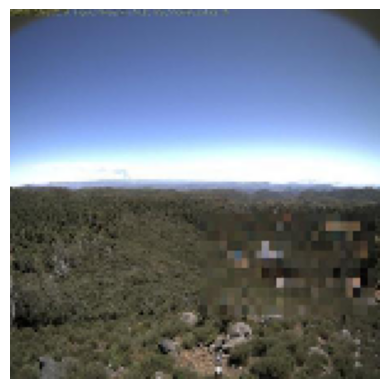

Label:  Sem fogo
Previsão:  Com fogo
Probabilidade:  0.9999931


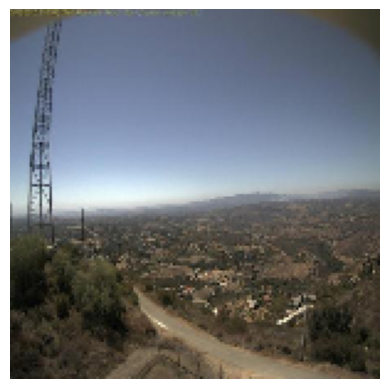

Label:  Sem fogo
Previsão:  Com fogo
Probabilidade:  0.9999455


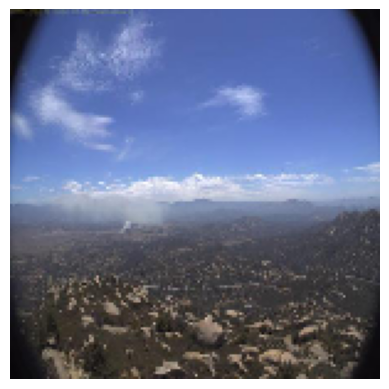

Label:  Sem fogo
Previsão:  Com fogo
Probabilidade:  0.9998694


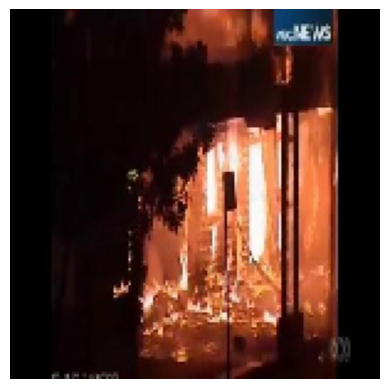

Label:  Com fogo
Previsão:  Sem fogo
Probabilidade:  0.008490545


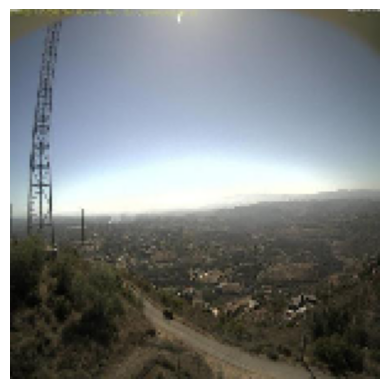

Label:  Sem fogo
Previsão:  Com fogo
Probabilidade:  0.9999957


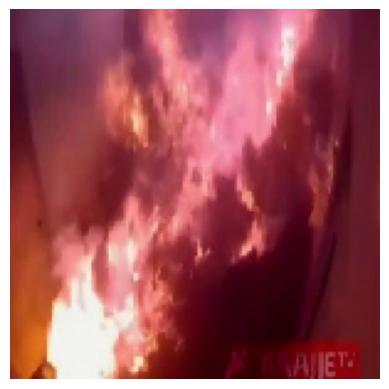

Label:  Com fogo
Previsão:  Sem fogo
Probabilidade:  0.15175726


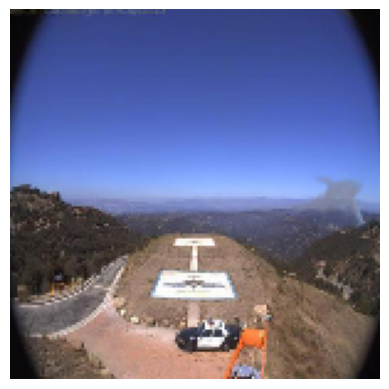

Label:  Sem fogo
Previsão:  Com fogo
Probabilidade:  0.9998066


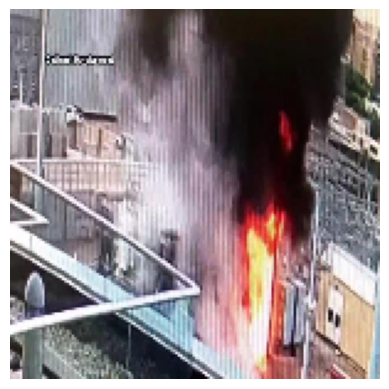

Label:  Sem fogo
Previsão:  Sem fogo
Probabilidade:  0.08716464


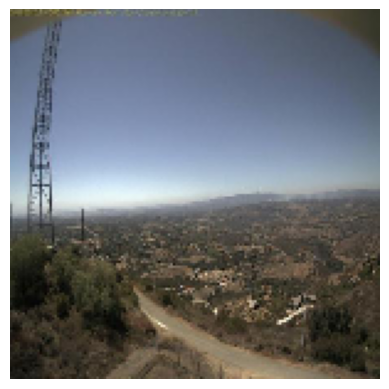

Label:  Sem fogo
Previsão:  Com fogo
Probabilidade:  0.999938


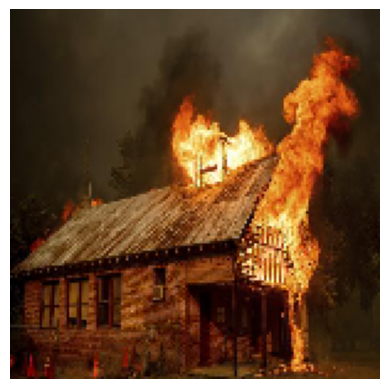

Label:  Com fogo
Previsão:  Com fogo
Probabilidade:  0.59671575


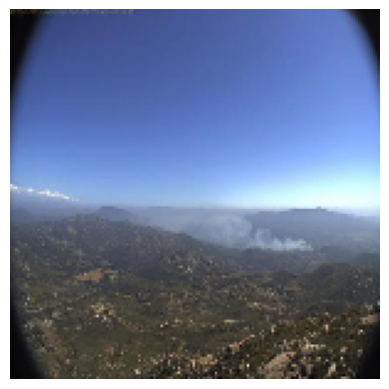

Label:  Sem fogo
Previsão:  Com fogo
Probabilidade:  0.99982935


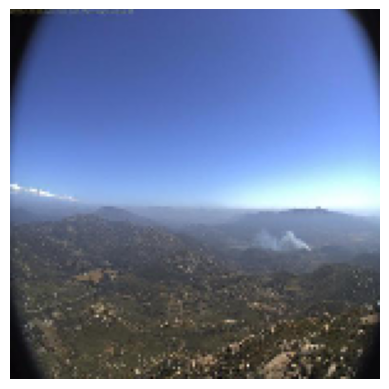

Label:  Sem fogo
Previsão:  Com fogo
Probabilidade:  0.99986535


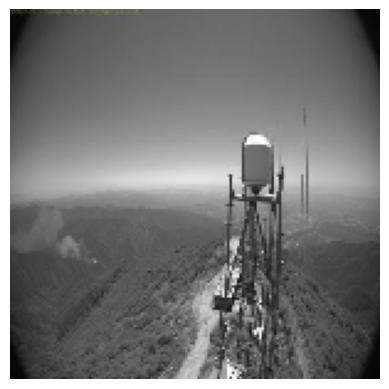

Label:  Sem fogo
Previsão:  Com fogo
Probabilidade:  0.99904794


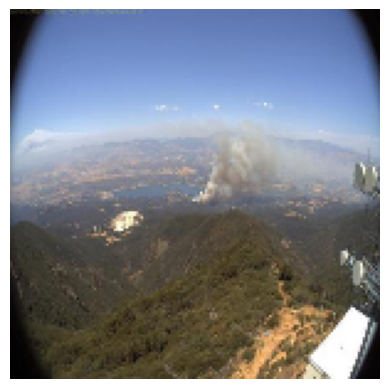

Label:  Sem fogo
Previsão:  Com fogo
Probabilidade:  0.9986057


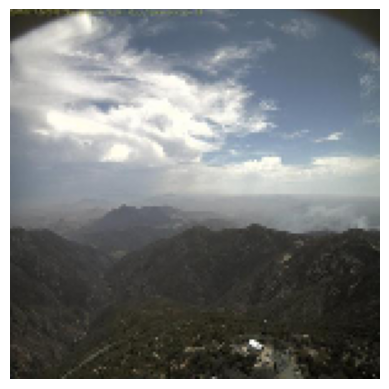

Label:  Sem fogo
Previsão:  Com fogo
Probabilidade:  0.9998589


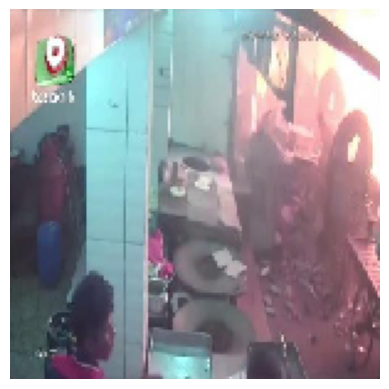

Label:  Com fogo
Previsão:  Sem fogo
Probabilidade:  0.02697582


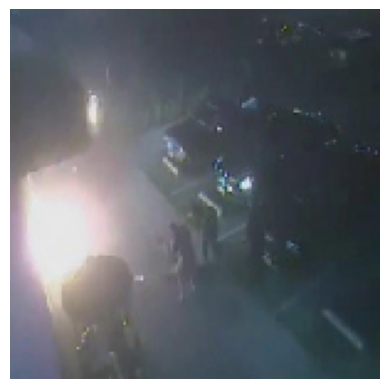

Label:  Com fogo
Previsão:  Sem fogo
Probabilidade:  0.12638949


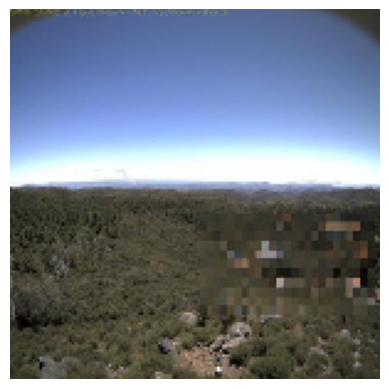

Label:  Sem fogo
Previsão:  Com fogo
Probabilidade:  0.99999315


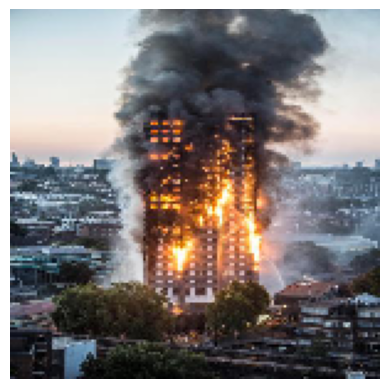

Label:  Com fogo
Previsão:  Sem fogo
Probabilidade:  0.154286


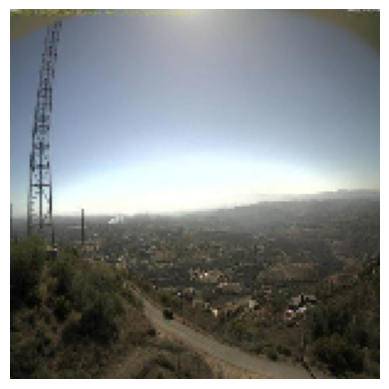

Label:  Sem fogo
Previsão:  Com fogo
Probabilidade:  0.999996


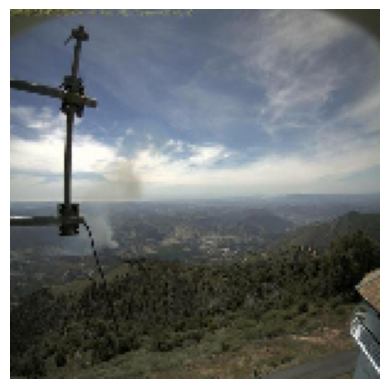

Label:  Sem fogo
Previsão:  Com fogo
Probabilidade:  0.99987245


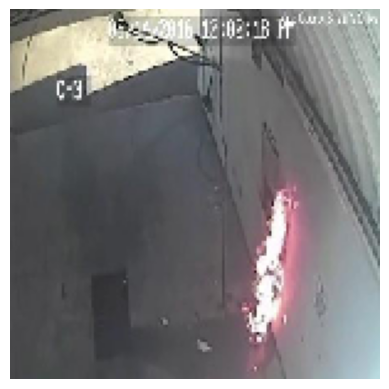

Label:  Com fogo
Previsão:  Sem fogo
Probabilidade:  0.0005147022


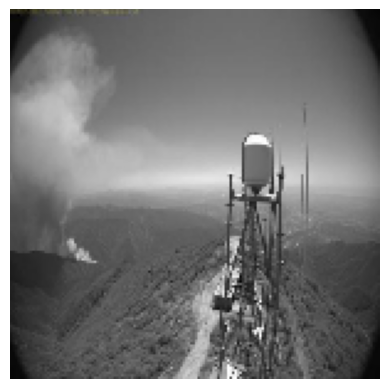

Label:  Sem fogo
Previsão:  Com fogo
Probabilidade:  0.998675


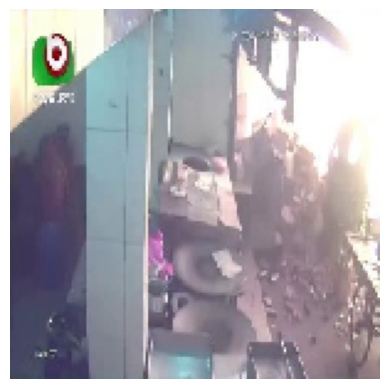

Label:  Com fogo
Previsão:  Sem fogo
Probabilidade:  0.0011342008


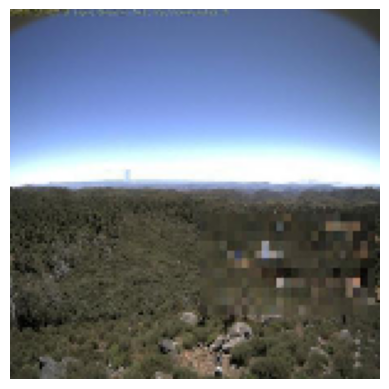

Label:  Sem fogo
Previsão:  Com fogo
Probabilidade:  0.9999933


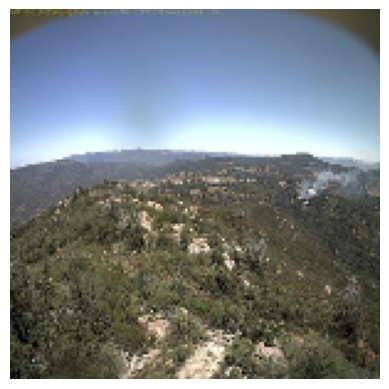

Label:  Sem fogo
Previsão:  Com fogo
Probabilidade:  0.99607396


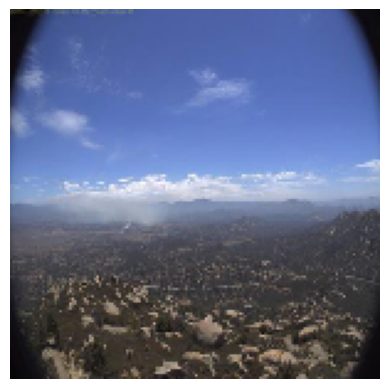

Label:  Sem fogo
Previsão:  Com fogo
Probabilidade:  0.9999183


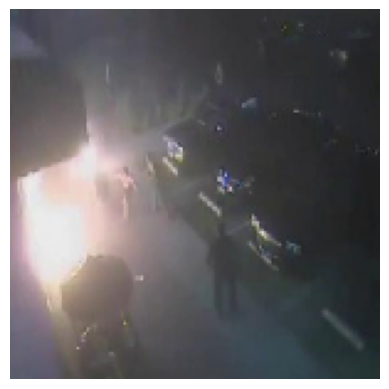

Label:  Com fogo
Previsão:  Sem fogo
Probabilidade:  0.13461307


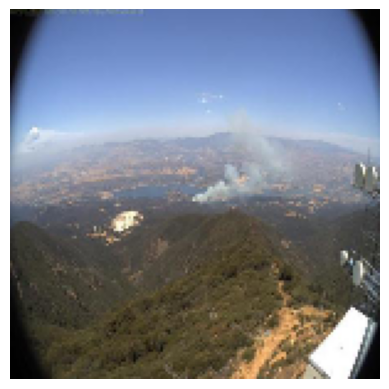

Label:  Sem fogo
Previsão:  Com fogo
Probabilidade:  0.9992103


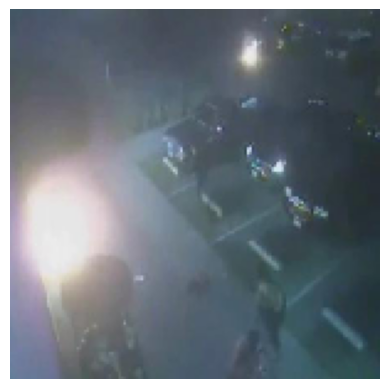

Label:  Com fogo
Previsão:  Sem fogo
Probabilidade:  0.15189558


In [ ]:
count = 0
y_pred = list()
y_true = list()
class_names = ['Com fogo', 'Sem fogo']

# Loop do data generator de teste que contem as imagens
for batch in test_generator:

    count+=1

    # Condição de saída do loop. Só executaremos o modelo em algumas imagens
    if count == 2: #Testar um valor maior que 2 aumenta a amostra
        break      #pode melhorar a matriz de confusão

    else:

        # Pegando a imagem e o label
        images = batch[0]
        labels = batch[1]

        # Previsão
        predictions = model.predict(images)

        # Visualização da imagem
        for i in range(len(images)):

            image = images[i]
            label = labels[i]
            prediction = predictions[i]

            # Converte o array de previsão para visualizar a classe e a probabilidade
            predicted_class = np.argmax(prediction)
            probability = prediction[predicted_class]
            label = class_names[int(label)]
            y_true.append(label)

            # Faz o DE-PARA da probabilidade com o tipo de classe da previsão
            class_name = 'Com fogo' if prediction >= 0.5 else 'Sem fogo'
            y_pred.append(class_name)

            # Configura a saída das imagens que serão visualizadas
            plt.imshow(images[i])
            plt.axis('Off')
            plt.show()

            # Imprime os resultados da classificação das images
            print("Label: ", label)
            print("Previsão: ", class_name)
            print("Probabilidade: ", probability)

# ***6. Avaliação do modelo de deep learning***

Acurácia do modelo nos dados de teste

In [ ]:
loss, accuracy = model.evaluate_generator(test_generator)
print("Test: accuracy = %f  ;  loss = %f " % (accuracy, loss))

<ipython-input-37-78954c843b8c>:1: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  loss, accuracy = model.evaluate_generator(test_generator)


Test: accuracy = 0.911538  ;  loss = 0.211847 


#### Visualização de métricas da avaliação do modelo

Métricas de performance do modelo no subconjunto das imagens de teste

In [ ]:
accuracy = skm.accuracy_score(y_true, y_pred)
precision = skm.precision_score(y_true, y_pred, average='weighted')
recall = skm.recall_score(y_true, y_pred, average='weighted')
f1score = skm.f1_score(y_true, y_pred, average='weighted')

print("Accuracy: ", accuracy)
print("Precision: ", precision)
print("Recall: ", recall)
print("F1 Score: ", f1score)

Accuracy:  0.0
Precision:  0.0
Recall:  0.0
F1 Score:  0.0


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Matriz de confusão para identificar onde o modelo de deep learning acertou e errou na classificação do subconjunto de imagens de teste

Matriz de confusão sem normalização


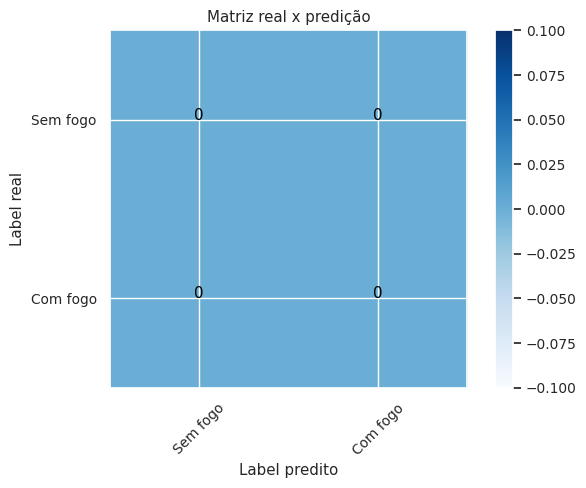

In [ ]:
cnf_matrix = confusion_matrix(y_true, y_pred, labels=class_names)
np.set_printoptions(precision=2)

plt.figure()
plot_confusion_matrix(cnf_matrix,
                      classes=['Sem fogo',
                               'Com fogo'],
                      normalize= False,
                      title='Matriz real x predição')

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def plot_confusion_matrix1(cm, classes):
    plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
    plt.title('Matriz de Confusão')
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = 'd'
    thresh = cm.max() / 2.
    for i, j in np.ndindex(cm.shape):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('Rótulo Real')
    plt.xlabel('Rótulo Previsto')
    plt.tight_layout()

#class_names['Sem fogo','Com fogo']
# Código para calcular a matriz de confusão
cnf_matrix1 = confusion_matrix(y_true, y_pred, labels=['Sem fogo','Com fogo'])
np.set_printoptions(precision=2)




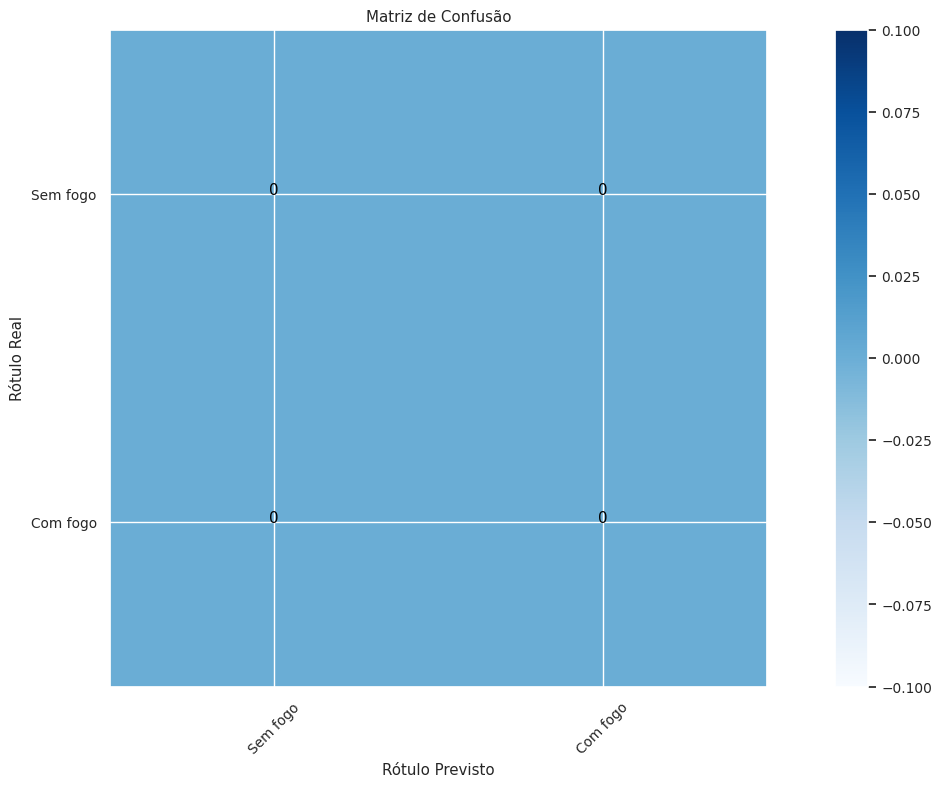

In [ ]:
# Código para exibir a matriz de confusão como gráfico
plt.figure(figsize=(14, 8))
#plt.figure()
plot_confusion_matrix1(cnf_matrix1, classes=['Sem fogo','Com fogo'])
plt.show()